In [1]:
import numpy as np
import os
from data import dnn_input
from data import classifier_input
from data import view_tracking_video
from sklearn.externals import joblib
from copy import copy, deepcopy
import matplotlib.pyplot as plt

/usr/local/lib/python3.7/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


In [2]:
test_data = dnn_input.get_processed_frames(os.path.abspath('./data/videos/frames_test/'), relative=False)
frames = dnn_input.get_frames(os.path.abspath('./data/videos/frames_test/'), start=1, end=46)
rois = test_data[1]

output_test = np.load('dnn_model_output.npy')

In [3]:
X_test_proper, y_test_proper = classifier_input.get_processed_classifier_input_inference(output_test, normalized=True, balanced=False, do_shuffle=False)

In [4]:
pca = joblib.load('./checkpoints/pca.joblib.pkl')
X_pca_test_proper = pca.transform(X_test_proper)

In [5]:
clf = joblib.load('./checkpoints/classifier.joblib.pkl')

In [6]:
print(clf.score(X_pca_test_proper, y_test_proper))
y_predict_proper = clf.predict(X_pca_test_proper)
y_predict_proper_prob = clf.predict_proba(X_pca_test_proper)[:,1]

0.9234782608695652


In [7]:
y_predict_proper_prob.shape

(4600,)

In [8]:
y_predict_proper

array([1, 0, 0, ..., 0, 0, 0])

In [9]:
y_test_proper = np.asarray(y_test_proper).reshape((46, 100))
y_test_proper_visualize = np.asarray(y_test_proper).reshape((46, 10, 10))

y_predict_proper = np.asarray(y_predict_proper).reshape((46, 100))
y_predict_proper_visualize = np.asarray(y_predict_proper).reshape((46, 10, 10))

# Show original

In [10]:
frame_roi_colors = np.zeros((rois.shape[0], rois.shape[1], 3))
frame_roi_colors_2 = np.zeros((rois.shape[0], rois.shape[1], 3))
frame_roi_colors_multiple = np.zeros((rois.shape[0], rois.shape[1]))
frame_roi_colors_original = np.zeros((rois.shape[0], rois.shape[1], 3))

colors = [
    (250, 0, 0),
    (0, 250, 0),
    (0, 0, 250),
    (250, 250, 0),
    (250, 0, 250),
    (0, 250, 250),
    (250, 250, 250),
    (100, 0, 50),
    (0, 50, 200),
    (70, 50, 200)
]

frame_roi_colors[0, :, :] = np.asarray(colors)
frame_roi_colors_2[0, :, :] = np.asarray(colors)

for i in range(rois.shape[0]):
    frame_roi_colors_original[i, :, :] = np.asarray(colors)



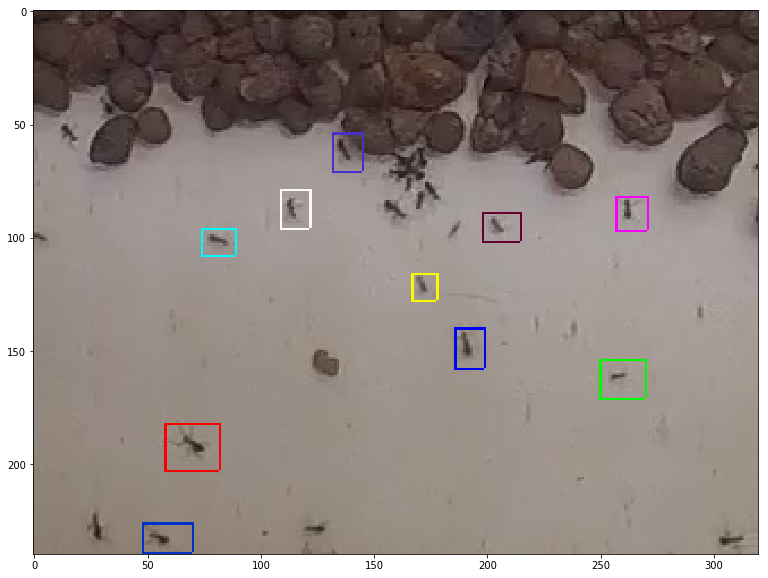

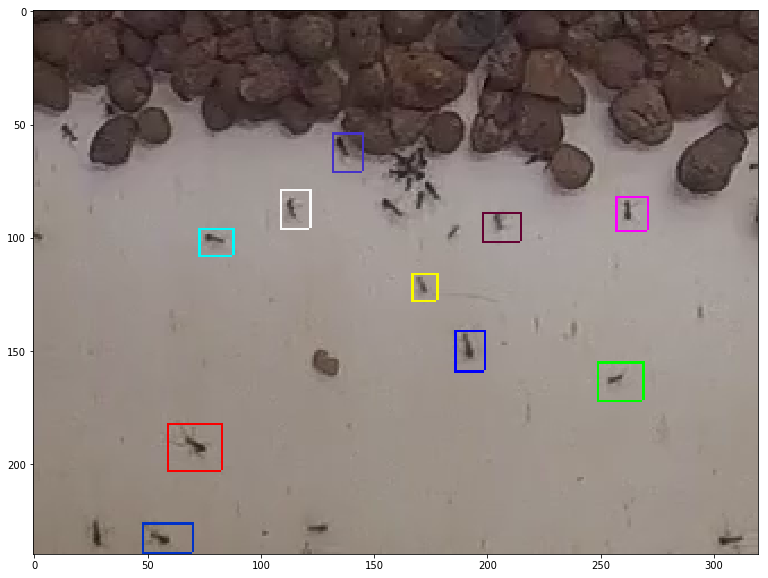

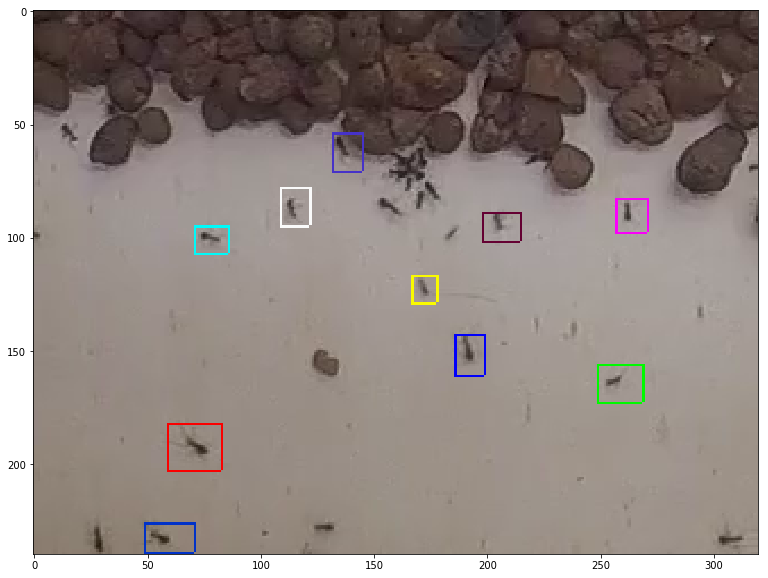

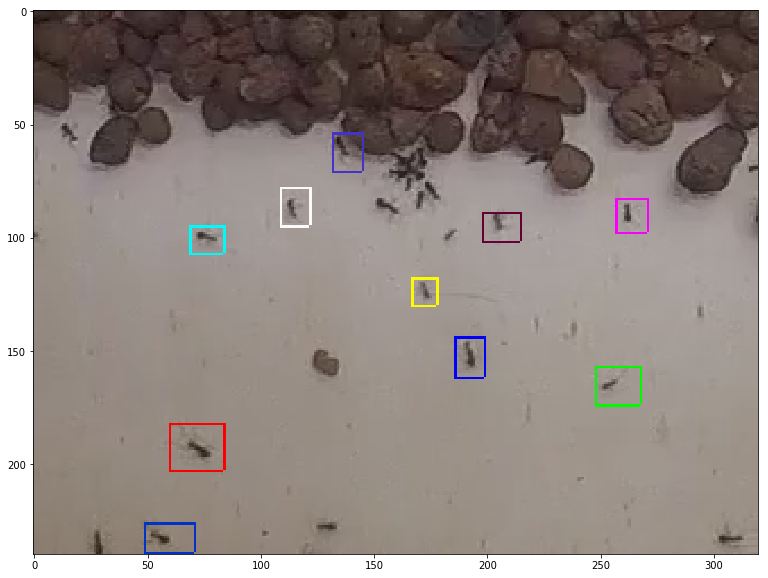

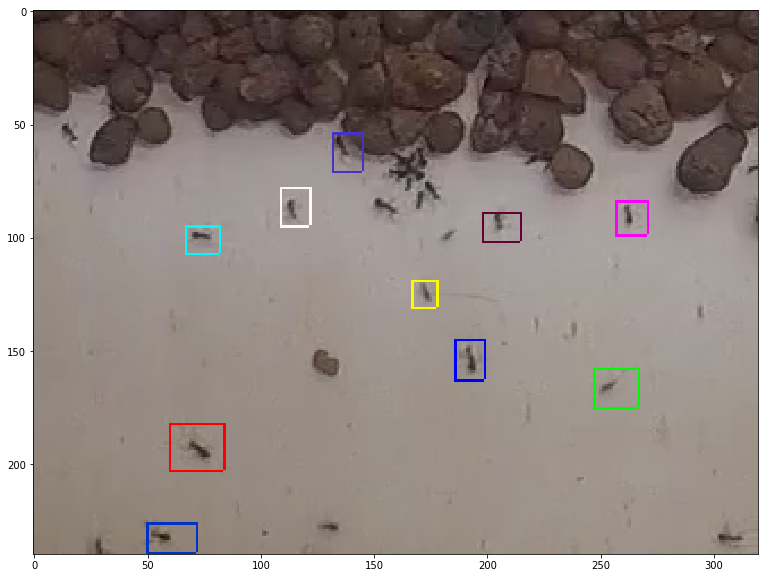

...

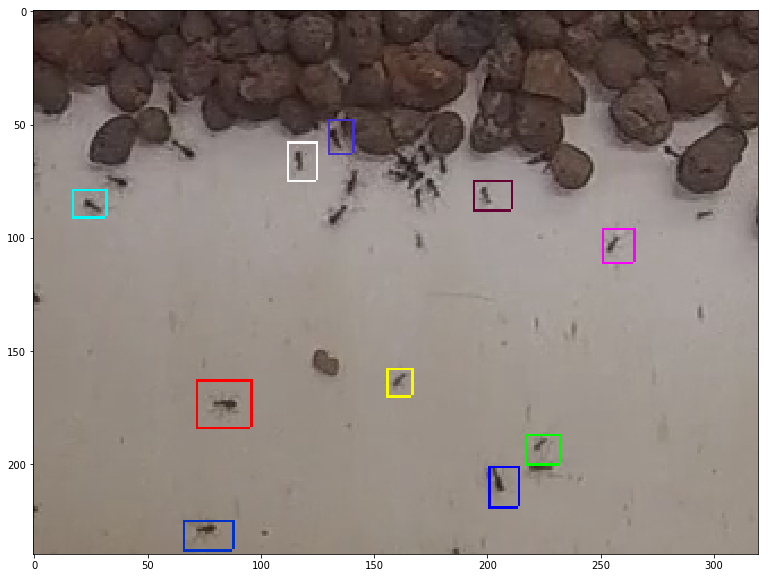

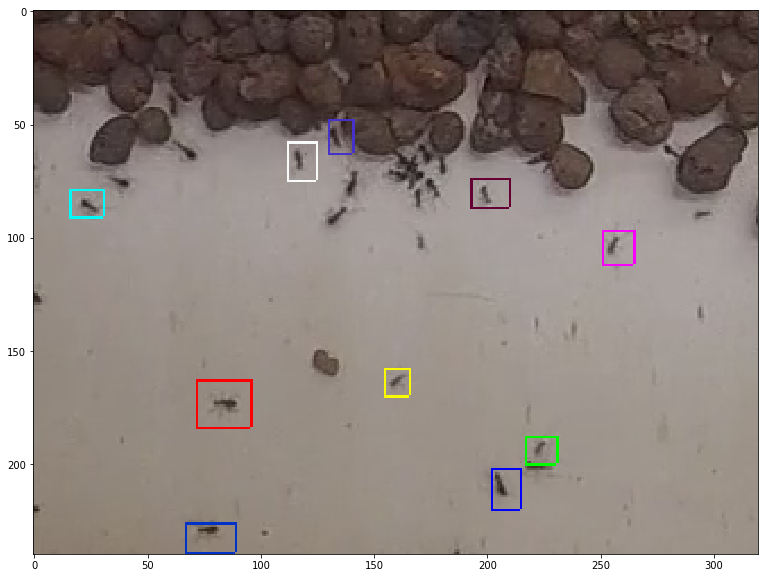

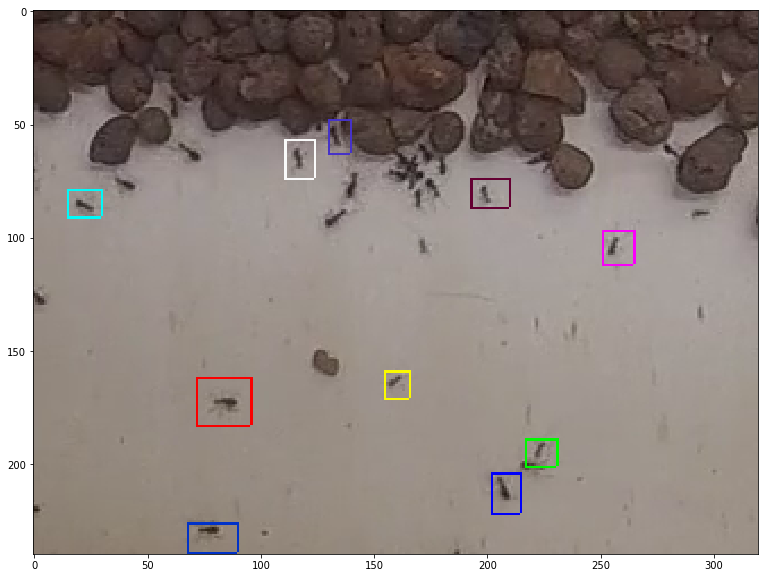

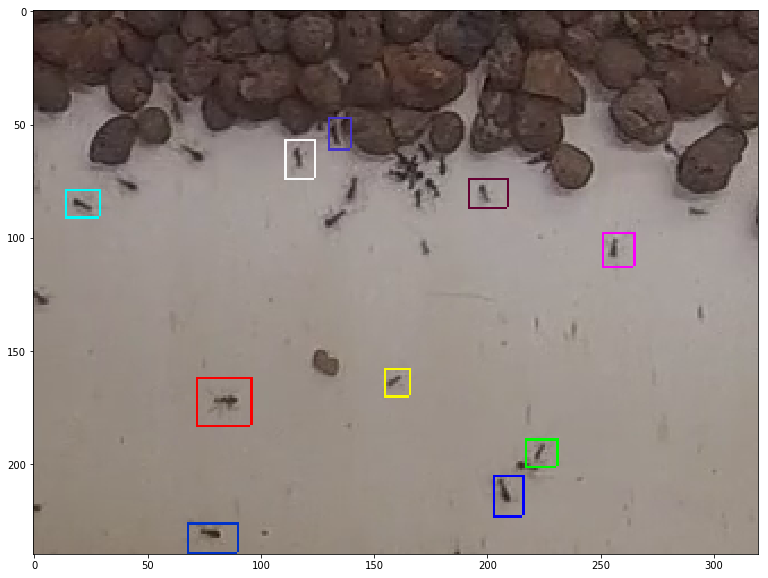

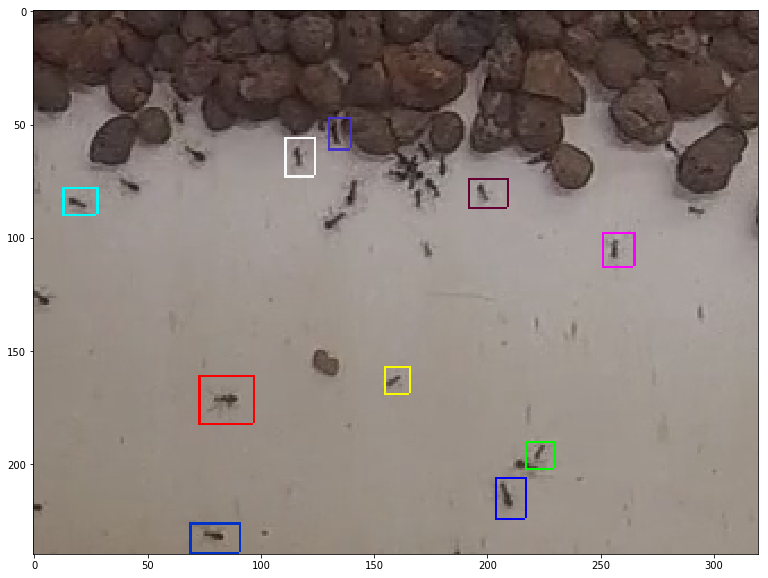

In [11]:
tracked_frames_original = view_tracking_video.add_tracks_with_colors(deepcopy(frames), rois, frame_roi_colors_original)
view_tracking_video.visualize_sequence(tracked_frames_original)

# Show tracks with multiple selection

In [17]:
for frame_index in range(0, y_predict_proper.shape[0] - 1):
    for roi_match_index in range(y_predict_proper.shape[1]):

        if y_predict_proper[frame_index, roi_match_index] == 1:
            current_frame_roi_index = int(roi_match_index / 10)
            future_frame_roi_index = roi_match_index % 10
            frame_roi_colors[frame_index+1, future_frame_roi_index] = frame_roi_colors[frame_index, current_frame_roi_index]

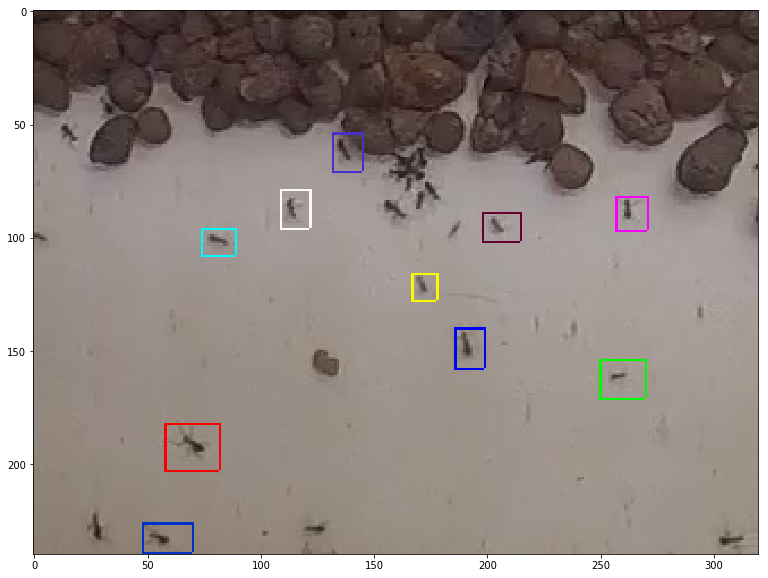

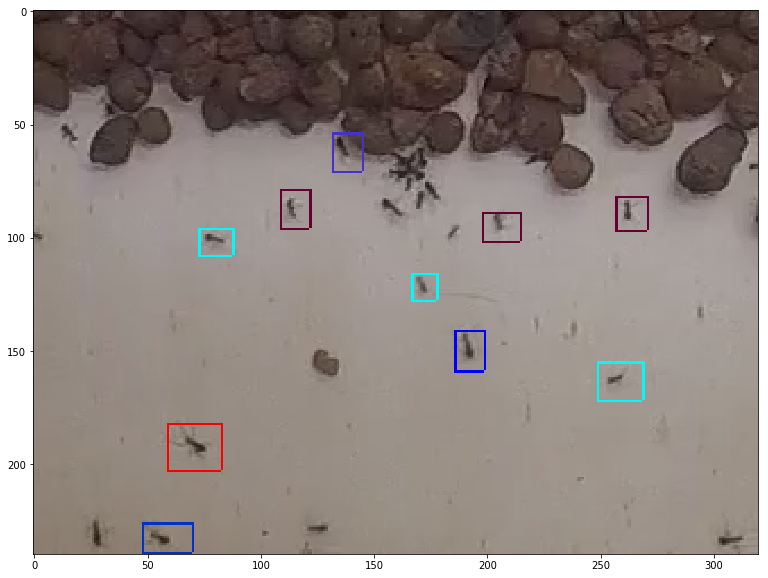

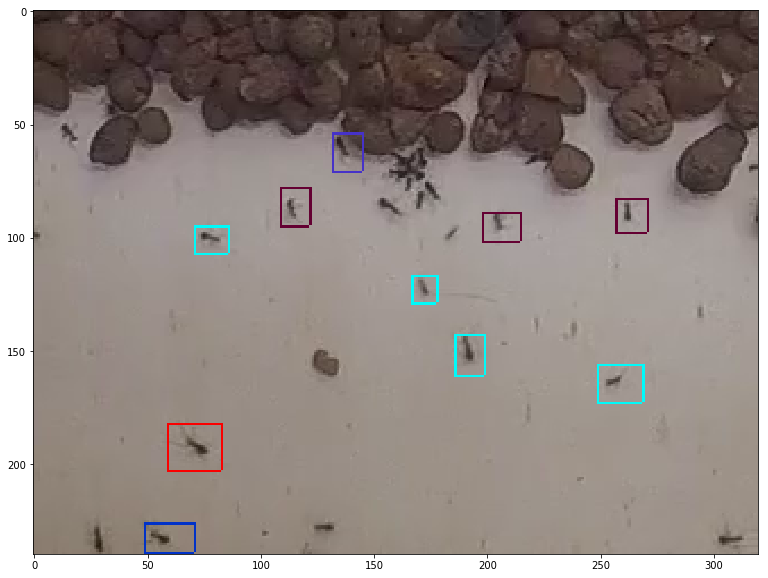

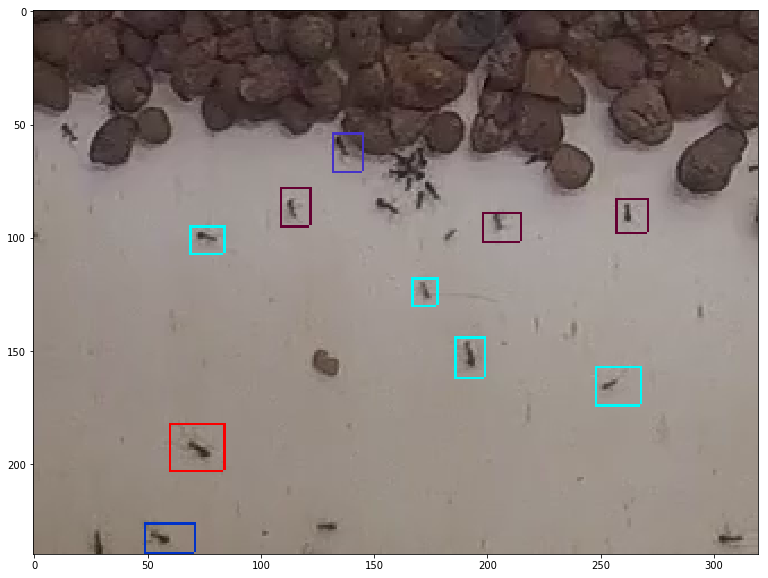

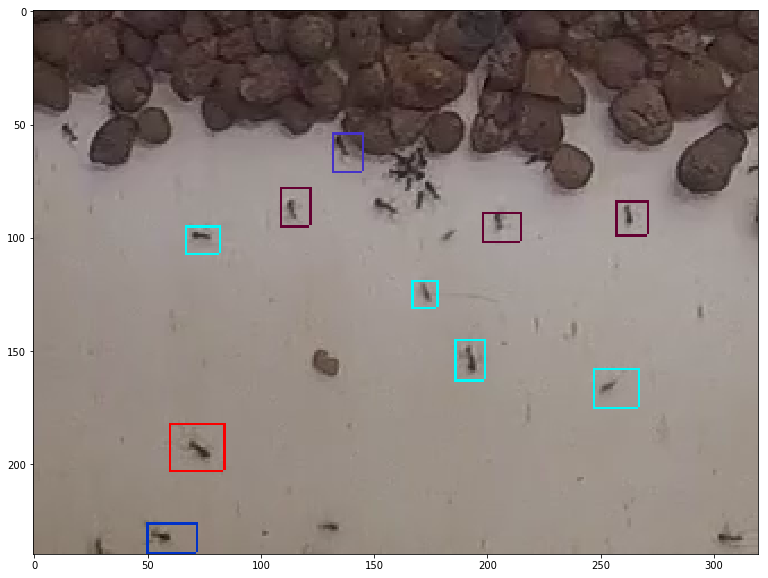

...

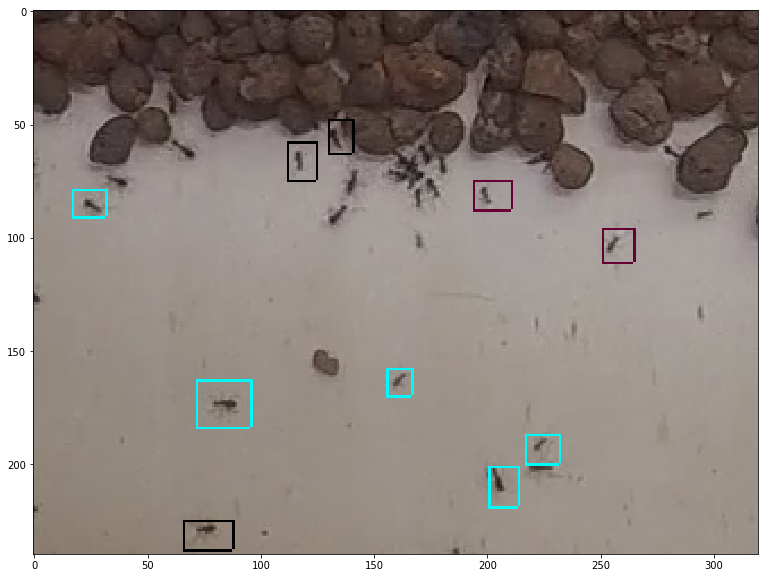

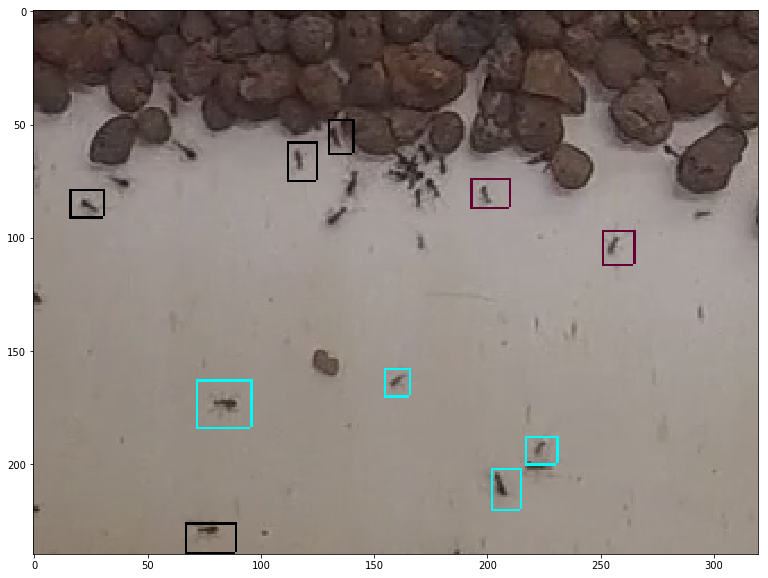

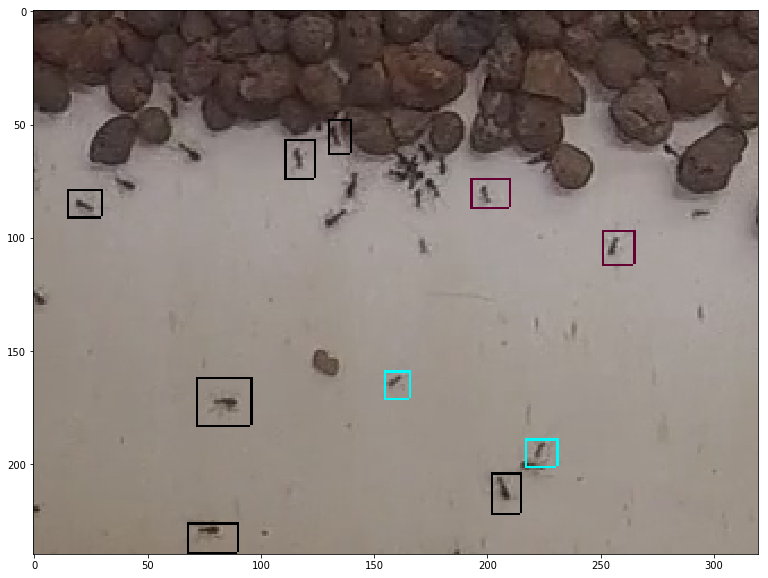

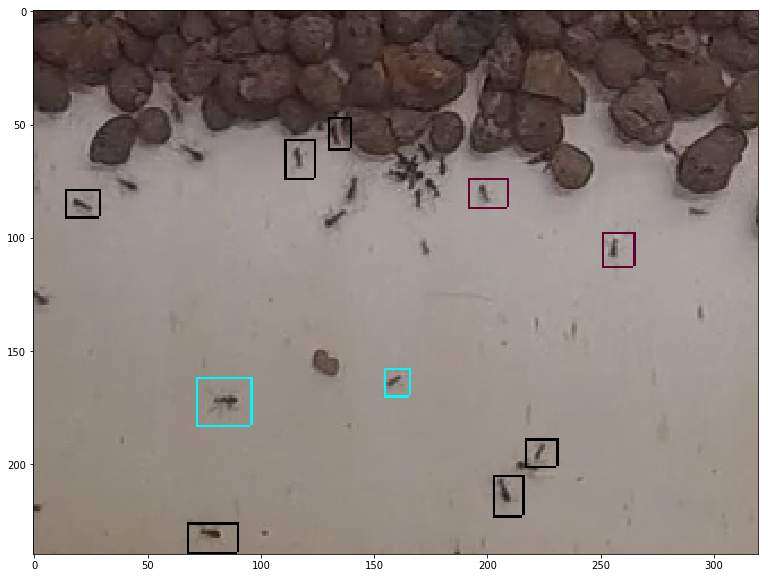

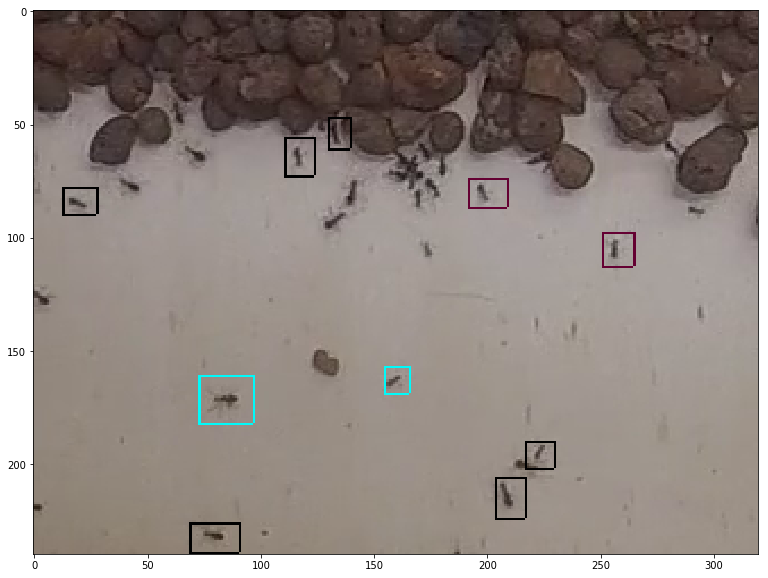

In [18]:
tracked_frames = view_tracking_video.add_tracks_with_colors(deepcopy(frames), rois, frame_roi_colors)
view_tracking_video.visualize_sequence(tracked_frames)

# Show tracks with single selection

In [ ]:
for frame_index in range(0, y_predict_proper.shape[0] - 1):
    for roi_match_index in range(y_predict_proper.shape[1]):

        if y_predict_proper[frame_index, roi_match_index] == 1:
            current_frame_roi_index = int(roi_match_index / 10)
            future_frame_roi_index = roi_match_index % 10
            frame_roi_colors_2[frame_index+1, future_frame_roi_index] = frame_roi_colors_original[frame_index, current_frame_roi_index]
            frame_roi_colors_multiple[frame_index+1, future_frame_roi_index] += 1

In [ ]:
tracked_frames = view_tracking_video.add_tracks_with_single_colors(deepcopy(frames), rois, frame_roi_colors_2, frame_roi_colors_multiple)
view_tracking_video.visualize_two_sequences(tracked_frames_original, tracked_frames)

## Draw tracks using probability

In [12]:
reshape_y_predict_proper_prob = y_predict_proper_prob.reshape((46, 10, 10))
for frame_index in range(0, 45):
    
    for f_roi in range(10):
        probs = reshape_y_predict_proper_prob[frame_index][:,f_roi]
        p_roi = np.argmax(probs)
        frame_roi_colors_2[frame_index+1, f_roi] = frame_roi_colors_original[frame_index, p_roi]


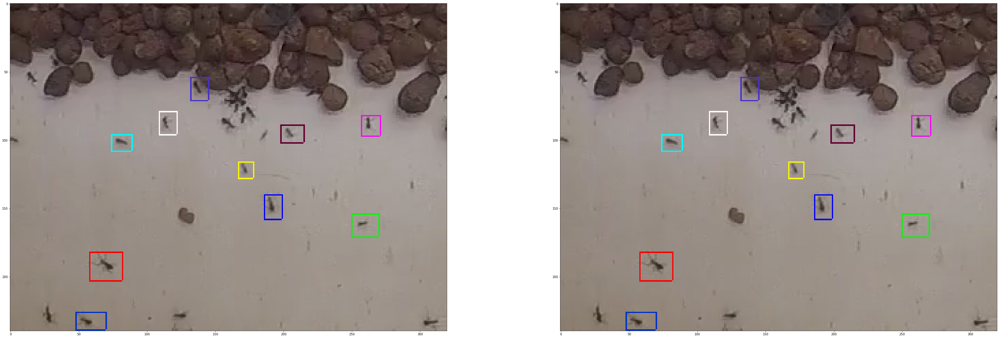

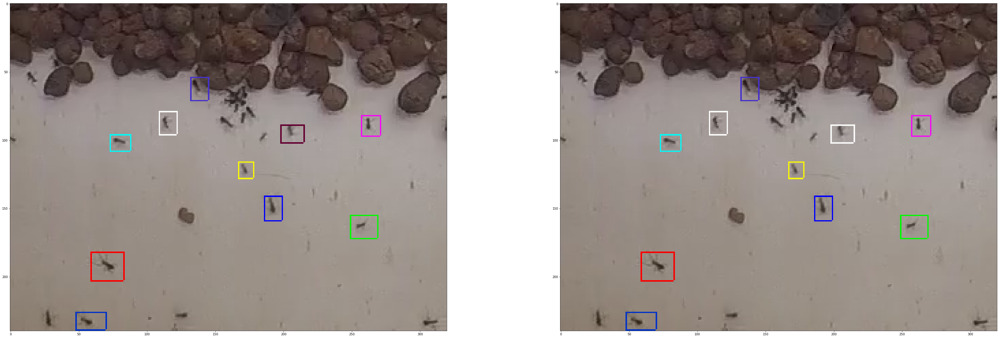

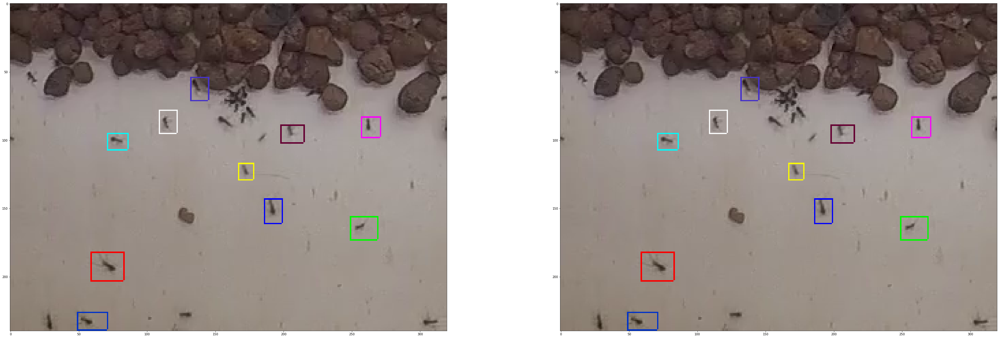

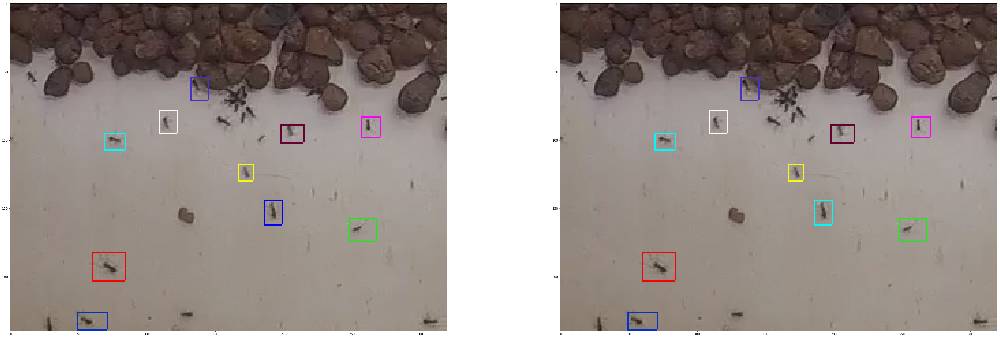

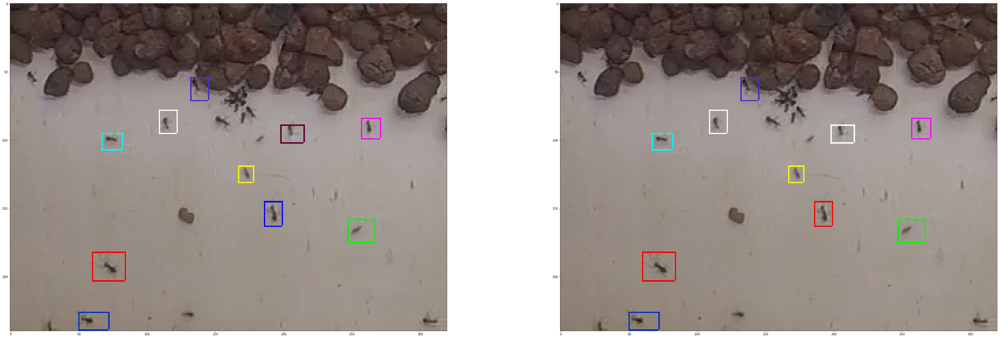

...

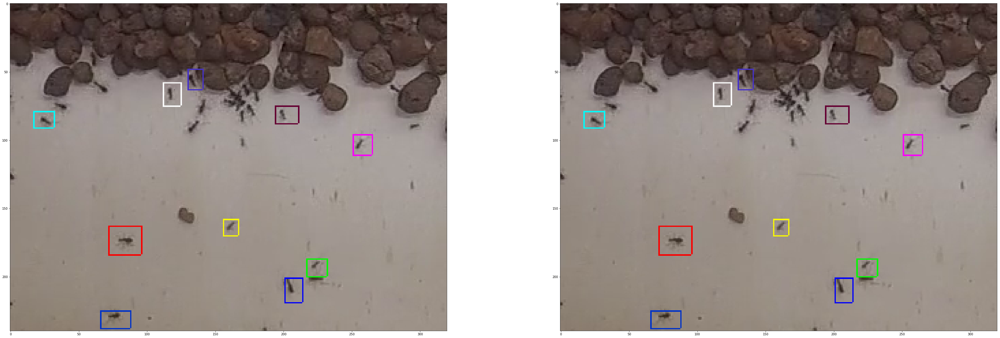

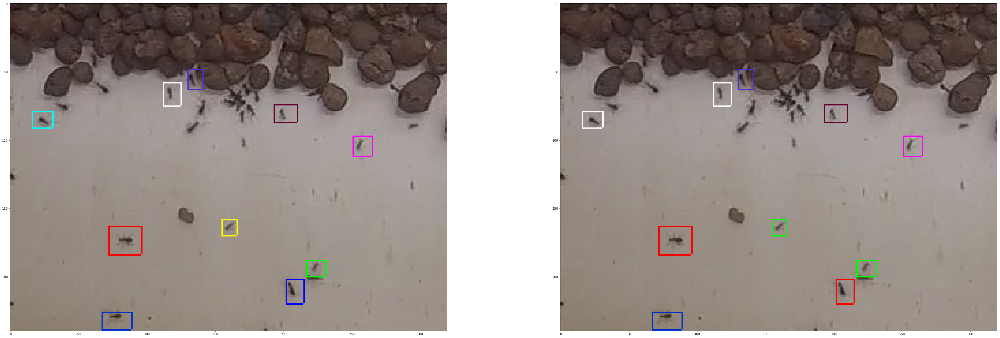

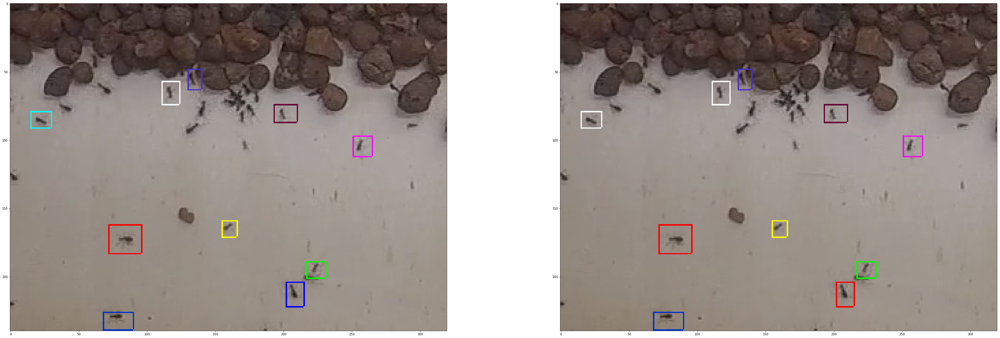

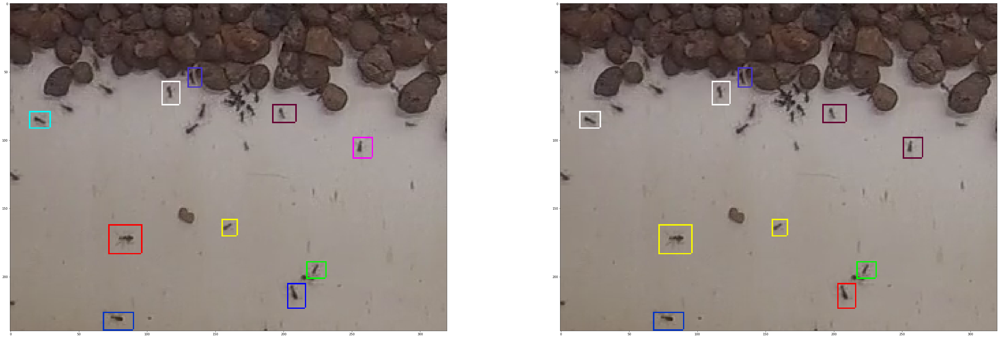

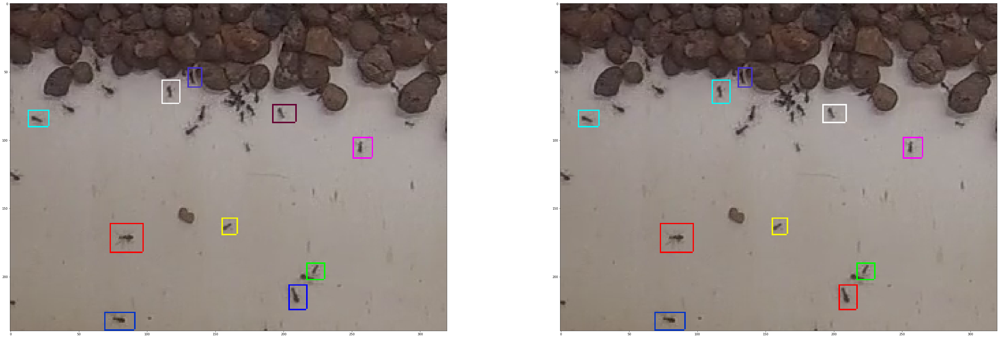

In [13]:
tracked_frames = view_tracking_video.add_tracks_with_colors(deepcopy(frames), rois, frame_roi_colors_2)
view_tracking_video.visualize_two_sequences(tracked_frames_original, tracked_frames)

# Color palette

In [14]:
color_frame = np.full((100,10, 3), 255)

In [15]:
for i in range(len(colors)):
    color = colors[i]
    color_frame[i*10: (i+1) * 10, :, :] = np.asarray(color)

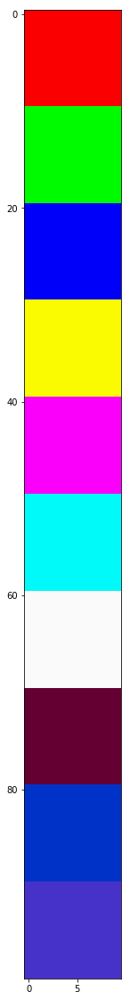

In [16]:
plt.imshow(color_frame)